In [ ]:
##This cell is for downloading and preparing data
#-------------------------------------------------
#gdown is used for downloading dataset to storage
!pip install gdown
#Downloading dataset
import gdown
file_id = ""  # Replace this with your file's ID
output_file = "data_file.zip"  # Replace "data_file.ext" with the desired output filename and extension
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)


In [2]:
%%capture
#Extracting zip file
!unzip data_file.zip

In [3]:
#General Imports
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import os
import tensorflow as tf
import keras

2024-03-21 10:08:45.383080: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-21 10:08:45.383175: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-21 10:08:45.513812: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
#Numpy Random Seed for reproducability
np.random.seed(32)

In [5]:
#Helper functions
def random_split_array(data, ratios=(0.8, 0.1, 0.1)):
    np.random.shuffle(data)  # Shuffle for randomness
    split_indices = np.cumsum(ratios[:-1]) * len(data)
    return np.split(data, split_indices.astype(int))

In [6]:
#Train-test-val split
original = []
for i in range(131) :
    original.append(i)

train, test, val = random_split_array(original,(0.8,0.1,0.1))

#These arrays will contain paths of images, and liver mask
X_train = []
Y_train = []
X_test = []
Y_test = []
X_val = []
Y_val = []

scan_list = os.listdir("//kaggle/working/Task03_Liver")
scan_list.sort()
for i in scan_list:
    num = int(i.split("_")[-1])
    path = "/kaggle/working/Task03_Liver/" + i
    imgpath = path + "/images"
    maskpath = path + "/masks"
    piclist = os.listdir(imgpath)
    if num in train:
        for j in piclist:
            X_train.append(imgpath + "/" + j)
            Y_train.append(maskpath + "/liver/" +j)
    elif num in test:
        for j in piclist:
            X_test.append(imgpath + "/" + j)
            Y_test.append(maskpath + "/liver/" +j)
    else:
        for j in piclist:
            X_val.append(imgpath + "/" + j)
            Y_val.append(maskpath + "/liver/" +j)



In [7]:
#This function will convert the path to the actual image by loading it from the memory.
def load_and_preprocess(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    return image

#Generating tf datasets
image_ds = tf.data.Dataset.from_tensor_slices(X_train)
image_ds = image_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask_ds = tf.data.Dataset.from_tensor_slices(Y_train)
mask_ds = mask_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = tf.data.Dataset.zip((image_ds,mask_ds))

image1_ds = tf.data.Dataset.from_tensor_slices(X_val)
image1_ds = image1_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask1_ds = tf.data.Dataset.from_tensor_slices(Y_val)
mask1_ds = mask1_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.zip((image1_ds,mask1_ds))

image2_ds = tf.data.Dataset.from_tensor_slices(X_test)
image2_ds = image2_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask2_ds = tf.data.Dataset.from_tensor_slices(Y_test)
mask2_ds = mask2_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = tf.data.Dataset.zip((image2_ds,mask2_ds))

In [8]:
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model

def conv_block(x, num_filters):
    x = L.Conv2D(num_filters, 3, padding="same")(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    x = L.Conv2D(num_filters, 3, padding="same")(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    return x

def encoder_block(x, num_filters):
    x = conv_block(x, num_filters)
    p = L.MaxPool2D((2, 2))(x)
    return x, p

def attention_gate(g, s, num_filters):
    Wg = L.Conv2D(num_filters, 1, padding="same")(g)
    Wg = L.BatchNormalization()(Wg)

    Ws = L.Conv2D(num_filters, 1, padding="same")(s)
    Ws = L.BatchNormalization()(Ws)

    out = L.Activation("relu")(Wg + Ws)
    out = L.Conv2D(num_filters, 1, padding="same")(out)
    out = L.Activation("sigmoid")(out)

    return out * s

def decoder_block(x, s, num_filters):
    x = L.UpSampling2D(interpolation="bilinear")(x)
    s = attention_gate(x, s, num_filters)
    x = L.Concatenate()([x, s])
    x = conv_block(x, num_filters)
    return x

def attention_unet(input_shape):
    """ Inputs """
    inputs = L.Input(input_shape)

    """ Encoder """
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)

    b1 = conv_block(p3, 512)

    """ Decoder """
    d1 = decoder_block(b1, s3, 256)
    d2 = decoder_block(d1, s2, 128)
    d3 = decoder_block(d2, s1, 64)

    """ Outputs """
    outputs = L.Conv2D(1, 1, padding="same", activation="sigmoid")(d3)

    """ Model """
    model = Model(inputs, outputs, name="Attention-UNET")
    return model

input_shape = (256, 256, 1)
model = attention_unet(input_shape)
model.summary()

Model: "Attention-UNET"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_4[0][0]  

 Total params: 8,142,017 (31.06 MB)

 Trainable params: 8,134,593 (31.03 MB)

 Non-trainable params: 7,424 (29.00 KB)

In [9]:
#Defining dice loss functions. dice is actual dice-function value, while dice_loss is 1-dice. if dice_loss is minimized, dice is maximized.
def dice_loss(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator + 1e-1)
    return 1 - dice

def dice(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator + 1e-20)
    return dice

In [10]:
#General callbacks
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}.weights.h5.keras".format('cxr_reg')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = False)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                   patience=5,
                                   verbose=1, mode='min', epsilon=0.0001, cooldown=2, min_lr=1e-8)
early = EarlyStopping(monitor="val_loss",
                      mode="min",
                      patience=10) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

In [11]:
BATCH_SIZE = 20
train_ds = train_ds.shuffle(buffer_size=100)  # Shuffle dataset for better training
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE)

In [12]:
#AdamW optimizer
model.compile(optimizer=tf.keras.optimizers.AdamW(), loss=dice_loss, metrics = [dice])

In [13]:
#Training the Model
history = model.fit(train_ds,
    epochs=30,
    validation_data=val_ds,
    callbacks = callbacks_list,
)

Epoch 1/30


2024-03-21 10:09:14.995695: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 1.67237, expected 0.693245
2024-03-21 10:09:14.995760: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 1.84259, expected 0.863458
2024-03-21 10:09:14.995769: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 2.35421, expected 1.37508
2024-03-21 10:09:14.995777: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 2.44188, expected 1.46276
2024-03-21 10:09:14.995785: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 2.10751, expected 1.12838
2024-03-21 10:09:14.995793: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 2.46902, expected 1.48989
2024-03-21 10:09:14.995800: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 2.62875, expected 1.64962
2024-03-21 10:09:14.995808: E external/local_xla/xla/

746/747 ━━━━━━━━━━━━━━━━━━━━ 0s 622ms/step - dice: 0.7925 - loss: 0.2075

2024-03-21 10:18:22.117261: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 1.67705, expected 0.725848
2024-03-21 10:18:22.117328: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 2.58541, expected 1.63421
2024-03-21 10:18:22.117338: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 2.97981, expected 2.02862
2024-03-21 10:18:22.117346: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 2.99106, expected 2.03986
2024-03-21 10:18:22.117354: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 3.18118, expected 2.22998
2024-03-21 10:18:22.117361: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 3.30243, expected 2.35123
2024-03-21 10:18:22.117369: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 3.27215, expected 2.32095
2024-03-21 10:18:22.117376: E external/local_xla/xla/s

747/747 ━━━━━━━━━━━━━━━━━━━━ 0s 680ms/step - dice: 0.7926 - loss: 0.2074

2024-03-21 10:19:36.090553: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 1.56128, expected 0.753217
2024-03-21 10:19:36.090621: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 1.43313, expected 0.625073
2024-03-21 10:19:36.090636: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 2.10298, expected 1.29493
2024-03-21 10:19:36.090650: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 2.11037, expected 1.30231
2024-03-21 10:19:36.090669: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 1.69944, expected 0.891379
2024-03-21 10:19:36.090690: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 2.31321, expected 1.50515
2024-03-21 10:19:36.090702: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 2.23039, expected 1.42233
2024-03-21 10:19:36.090714: E external/local_xla/xla


Epoch 1: val_loss improved from inf to 0.29398, saving model to cxr_reg.weights.h5.keras
747/747 ━━━━━━━━━━━━━━━━━━━━ 648s 737ms/step - dice: 0.7927 - loss: 0.2073 - val_dice: 0.7060 - val_loss: 0.2940 - learning_rate: 0.0010
Epoch 2/30
747/747 ━━━━━━━━━━━━━━━━━━━━ 0s 622ms/step - dice: 0.9351 - loss: 0.0649
Epoch 2: val_loss improved from 0.29398 to 0.09136, saving model to cxr_reg.weights.h5.keras
747/747 ━━━━━━━━━━━━━━━━━━━━ 496s 663ms/step - dice: 0.9351 - loss: 0.0649 - val_dice: 0.9086 - val_loss: 0.0914 - learning_rate: 0.0010
Epoch 3/30
747/747 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - dice: 0.9461 - loss: 0.0539
Epoch 3: val_loss did not improve from 0.09136
747/747 ━━━━━━━━━━━━━━━━━━━━ 502s 663ms/step - dice: 0.9461 - loss: 0.0539 - val_dice: 0.8231 - val_loss: 0.1769 - learning_rate: 0.0010
Epoch 4/30
747/747 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - dice: 0.9516 - loss: 0.0484
Epoch 4: val_loss did not improve from 0.09136
747/747 ━━━━━━━━━━━━━━━━━━━━ 495s 663ms/step - dice: 0.9516 

In [14]:
#Loading best validation weights for testing further
model.load_weights("/kaggle/working/cxr_reg.weights.h5.keras")

In [15]:
#Generating test arrays from test_ds
Xts =[]
Yts =[]
for i in test_ds:
    x,y=i
    Xts.append(x)
    Yts.append(y)

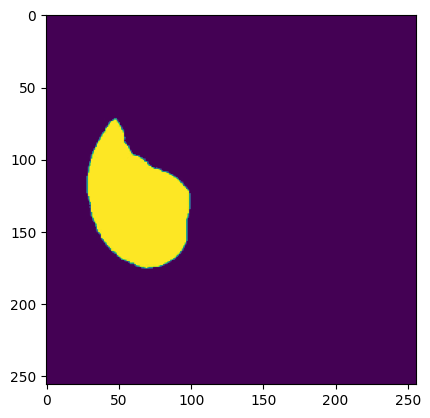

In [16]:
#checking image mask pair correspondance
#This is mask
plt.imshow(Yts[17])

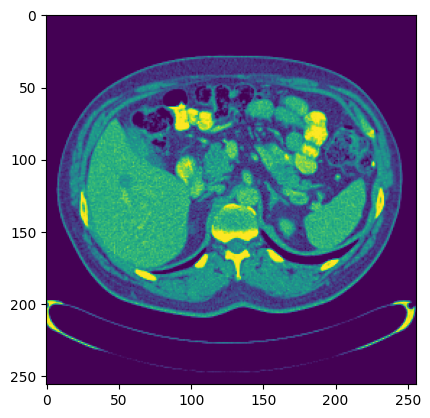

In [17]:
#This is corresponding image
plt.imshow(Xts[17])

In [18]:
#Evaluating model on test dataset
model.evaluate(np.array(Xts),np.array(Yts))

2024-03-21 13:38:40.363489: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 1.05936, expected 0.681349
2024-03-21 13:38:40.363549: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 2.21753, expected 1.83952
2024-03-21 13:38:40.363558: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 2.5462, expected 2.16819
2024-03-21 13:38:40.363566: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 2.07291, expected 1.6949
2024-03-21 13:38:40.363574: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 2.56529, expected 2.18728
2024-03-21 13:38:40.363582: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65542: 2.19261, expected 1.8146
2024-03-21 13:38:40.363589: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65543: 1.83463, expected 1.45662
2024-03-21 13:38:40.363597: E

62/63 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - dice: 0.9457 - loss: 0.0543

2024-03-21 13:39:48.329522: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 0.961309, expected 0.421057
2024-03-21 13:39:48.329587: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 2.31528, expected 1.77503
2024-03-21 13:39:48.329603: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 2.17812, expected 1.63786
2024-03-21 13:39:48.329620: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 2.11732, expected 1.57707
2024-03-21 13:39:48.329633: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 2.64766, expected 2.1074
2024-03-21 13:39:48.329643: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65541: 2.68691, expected 2.14665
2024-03-21 13:39:48.329653: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65542: 2.00241, expected 1.46216
2024-03-21 13:39:48.329663

63/63 ━━━━━━━━━━━━━━━━━━━━ 77s 511ms/step - dice: 0.9454 - loss: 0.0546


[0.061524804681539536, 0.9384755492210388]

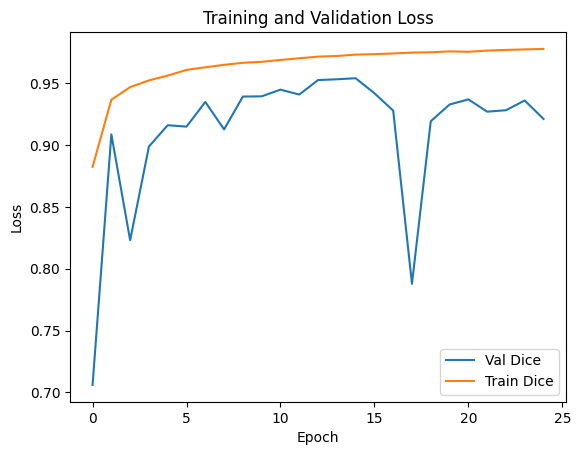

In [19]:
#Training and validation loss curves
plt.plot(history.history['val_dice'], label='Val Dice')
plt.plot(history.history['dice'], label='Train Dice')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

['/kaggle/working/Task03_Liver/liver_24/images/248.jpg', '/kaggle/working/Task03_Liver/liver_35/images/31.jpg', '/kaggle/working/Task03_Liver/liver_11/images/357.jpg', '/kaggle/working/Task03_Liver/liver_11/images/349.jpg', '/kaggle/working/Task03_Liver/liver_10/images/333.jpg', '/kaggle/working/Task03_Liver/liver_82/images/481.jpg', '/kaggle/working/Task03_Liver/liver_121/images/233.jpg', '/kaggle/working/Task03_Liver/liver_82/images/374.jpg', '/kaggle/working/Task03_Liver/liver_84/images/398.jpg', '/kaggle/working/Task03_Liver/liver_100/images/477.jpg', '/kaggle/working/Task03_Liver/liver_65/images/471.jpg', '/kaggle/working/Task03_Liver/liver_84/images/461.jpg', '/kaggle/working/Task03_Liver/liver_121/images/237.jpg', '/kaggle/working/Task03_Liver/liver_100/images/637.jpg', '/kaggle/working/Task03_Liver/liver_24/images/173.jpg', '/kaggle/working/Task03_Liver/liver_10/images/320.jpg', '/kaggle/working/Task03_Liver/liver_34/images/71.jpg', '/kaggle/working/Task03_Liver/liver_82/images

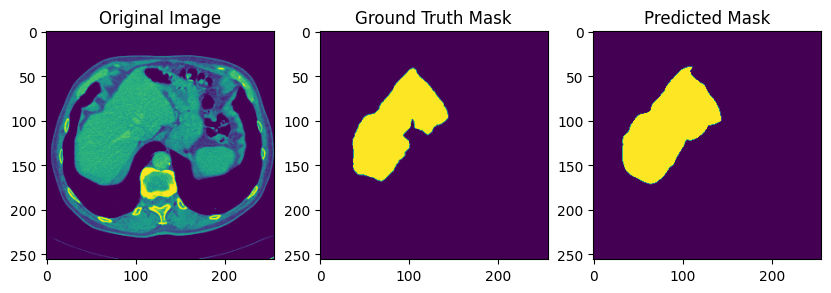

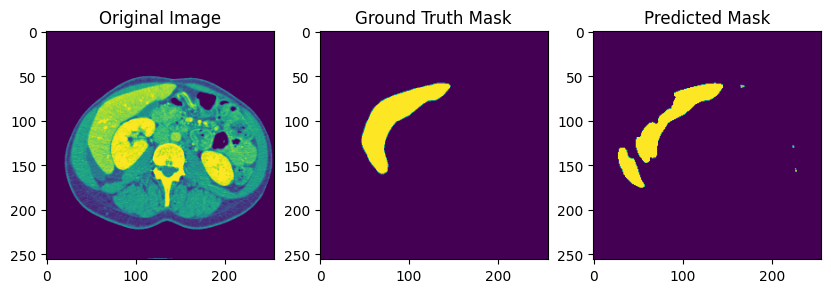

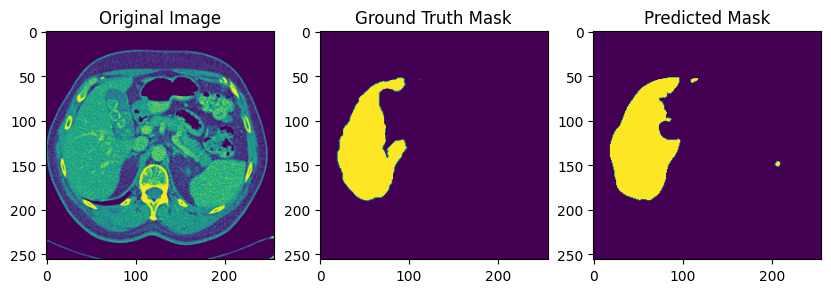

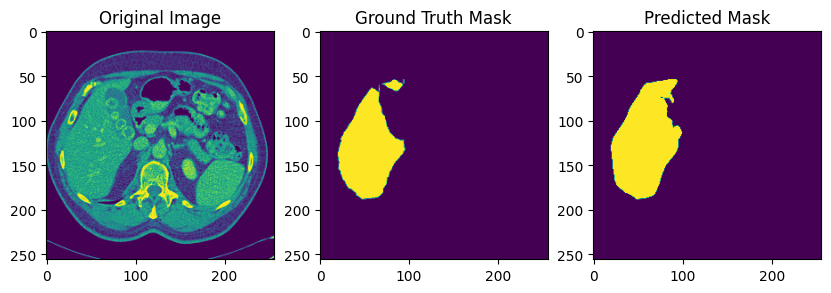

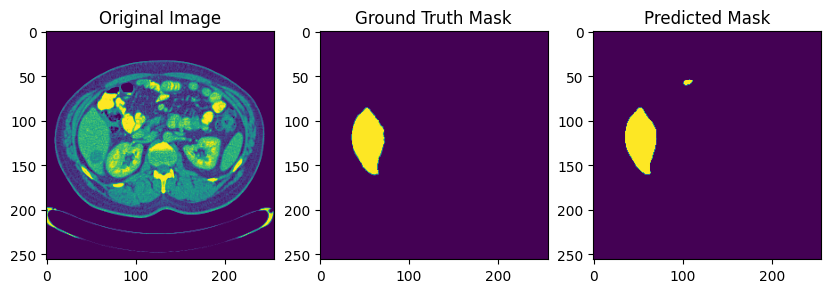

...

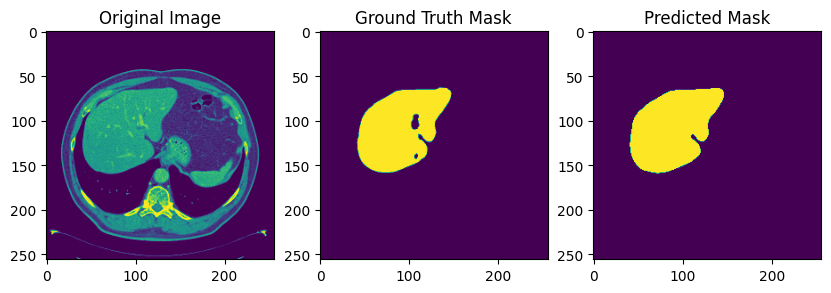

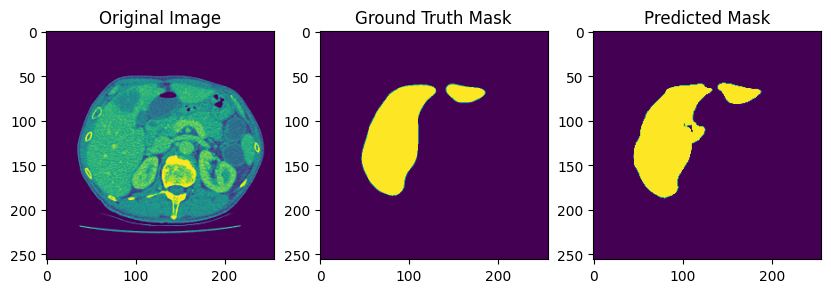

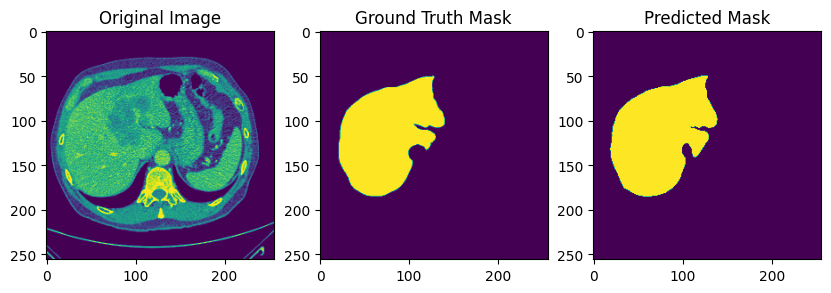

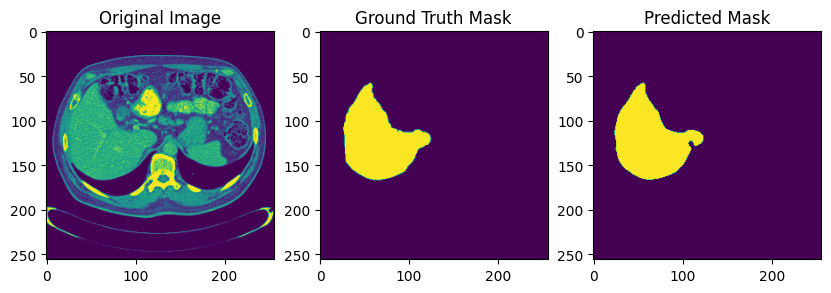

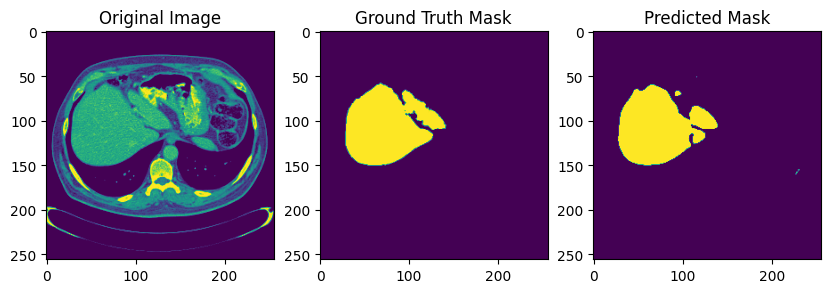

In [20]:
##This section chooses 100 random images from X_test and Y_test and shows the model output on them, along with input and ground truth
import random
# Select 100 random images from X_test and Y_test
random_indices = random.sample(range(len(X_test)), 100)
selected_X_test = [X_test[i] for i in random_indices]
selected_Y_test = [Y_test[i] for i in random_indices]
print(selected_X_test)
g = lambda x:load_and_preprocess(x)
imgs = [g(x) for x in selected_X_test]
# Evaluate the model on the selected images
y_pred = model.predict(np.array(imgs))

# Compare the model output and Y
for i in range(100):
  plt.figure(figsize=(10, 5))

  # Original image
  plt.subplot(1, 3, 1)
  plt.imshow(g(selected_X_test[i]))
  plt.title('Original Image')

  # Ground truth mask
  plt.subplot(1, 3, 2)
  plt.imshow(g(selected_Y_test[i]))
  plt.title('Ground Truth Mask')

  # Predicted mask
  plt.subplot(1, 3, 3)
  plt.imshow(y_pred[i])
  plt.title('Predicted Mask')

  plt.show()


In [21]:
# !zip /content/wts.zip /content/cxr_reg.weights.h5.keras

In [22]:
# !cp /content/wts.zip /content/drive/MyDrive